In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalMaxPool2D, GlobalAveragePooling2D
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model

In [2]:
import tensorflow as tf

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
if tf.config.list_physical_devices('GPU'):
    print("GPU is available")
else:
    print("GPU is not available, please check your installation")


Num GPUs Available:  1
GPU is available


In [3]:
# dataset을 training set과 validation set으로 나누기 8:2비율
batch_size = 32
img_height = 224
img_width = 224

image_directory = './Digital images of defective and good condition tyres'


train_data = tf.keras.utils.image_dataset_from_directory(
    image_directory,  # 이미지가 저장된 디렉토리 경로
    validation_split=0.2,  # 데이터셋을 훈련과 검증으로 나누는 비율 (여기서는 20%를 검증 데이터로 사용)
    seed=123,  # 데이터셋 분할의 재현성을 위해 사용되는 시드 값
    subset='training',  # 훈련 데이터셋을 생성하기 위해 'training' 서브셋을 지정
    image_size=(img_height, img_width),  # 이미지 크기를 (img_height, img_width)로 조정
    batch_size=batch_size  # 배치 크기를 지정
)

class_names=train_data.class_names
print(class_names)

# validation data 만들기
val_data = tf.keras.utils.image_dataset_from_directory(
    image_directory,  # 이미지가 저장된 디렉토리 경로
    validation_split=0.2,  # 데이터셋을 훈련과 검증으로 나누는 비율
    seed=123,  # 데이터셋 분할의 재현성을 위해 사용되는 시드 값
    subset='validation',  # 검증 데이터셋을 생성하기 위해 'validation' 서브셋을 지정
    image_size=(img_height, img_width),  # 이미지 크기를 (img_height, img_width)로 조정
    batch_size=batch_size  # 배치 크기를 지정
)

Found 1856 files belonging to 2 classes.
Using 1485 files for training.
['defective', 'good']
Found 1856 files belonging to 2 classes.
Using 371 files for validation.


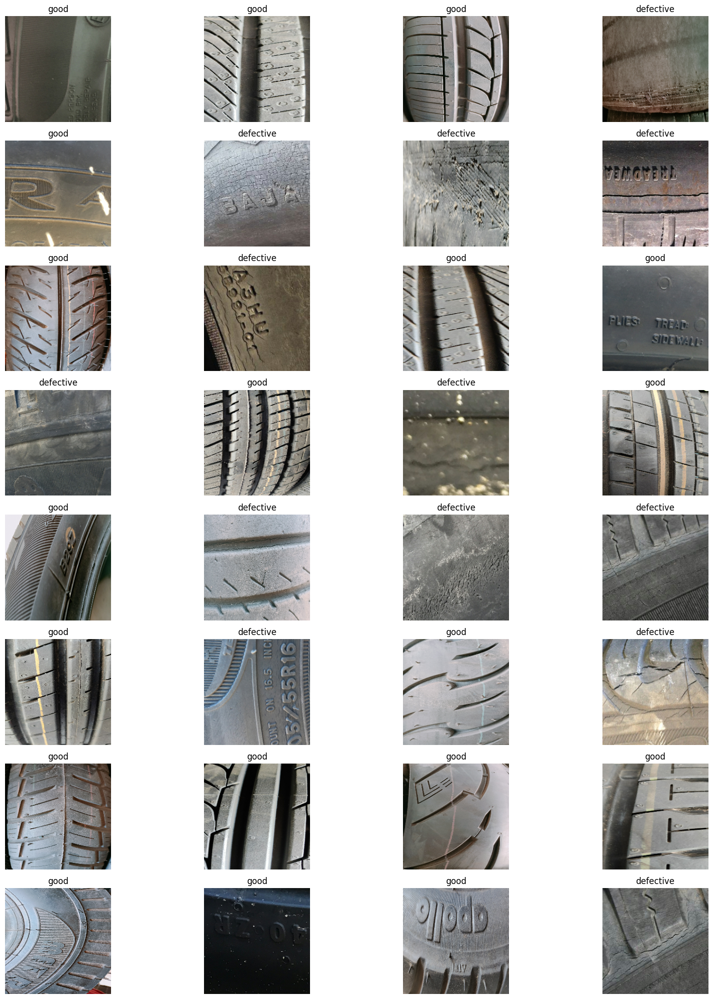

In [4]:
# Plot the images
plt.figure(figsize=(20,20), tight_layout=True, facecolor="white")
for image, label in train_data.take(1):
    for i in range(32):
        ax=plt.subplot(8, 4, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        plt.title(class_names[label[i]])
        plt.axis("off")

# 전이 학습을 통한 모델 훈련

In [6]:
import tensorflow as tf

# 사전 훈련된 ResNet50 모델 내려받기 (마지막 분류 레이어 제외)
base_model = tf.keras.applications.ResNet50(include_top=False, weights="imagenet")

# 베이스 모델 동결: 가중치가 변경되지 않도록 함
base_model.trainable = False

# 입력 레이어 생성
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model(inputs)

# 베이스 모델을 통과한 후 출력 데이터의 형태를 확인
print(f"Shape after base_model: {x.shape}")

# 글로벌 평균 풀링 및 추가 레이어 추가
x = tf.keras.layers.GlobalAveragePooling2D(name="global_average_pooling_layer")(x)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(512, activation="relu")(x)

# 출력 레이어 생성
outputs = tf.keras.layers.Dense(1, activation="sigmoid", name="output_layer")(x)

# 모델 생성
model = tf.keras.Model(inputs, outputs, name="model")

# 모델 컴파일
model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics=["accuracy"])

# 모델 요약 출력
model.summary()

# 콜백 설정
learning_rate_reduction = tf.keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    patience=2,
    factor=0.5,
    min_lr=0.00001,
    verbose=1
)

Early_Stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)




Shape after base_model: (None, 7, 7, 2048)
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, None, None, 2048)  23587712  
                                                                 
 global_average_pooling_laye  (None, 2048)             0         
 r (GlobalAveragePooling2D)                                      
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               1049088   
                                                                 
 output_layer (Dense)        (None, 1)                 513       
                  

In [7]:
# 모델 학습
history = model.fit(train_data,
                    validation_data=val_data,
                    epochs=100,
                    callbacks=[learning_rate_reduction, Early_Stopping])

# Fine-tuning 준비: 베이스 모델의 특정 레이어부터 동결 해제
base_model.trainable = True

# 특정 레이어까지만 동결 해제 (예: 마지막 10개 레이어만 학습 가능하도록 설정)
fine_tune_at = len(base_model.layers) - 10

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# 모델을 다시 컴파일 (더 낮은 학습률 사용)
model.compile(loss=tf.keras.losses.BinaryCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
              metrics=["accuracy"])

Epoch 1/100
47/47 [==============================] - 20s 354ms/step - loss: 0.3127 - accuracy: 0.8687 - val_loss: 0.1814 - val_accuracy: 0.9353 - lr: 0.0010
Epoch 2/100
47/47 [==============================] - 17s 340ms/step - loss: 0.1067 - accuracy: 0.9603 - val_loss: 0.1385 - val_accuracy: 0.9542 - lr: 0.0010
Epoch 3/100
47/47 [==============================] - 17s 338ms/step - loss: 0.0450 - accuracy: 0.9879 - val_loss: 0.1287 - val_accuracy: 0.9488 - lr: 0.0010
Epoch 4/100
47/47 [==============================] - 17s 336ms/step - loss: 0.0205 - accuracy: 0.9966 - val_loss: 0.1228 - val_accuracy: 0.9596 - lr: 0.0010
Epoch 5/100
47/47 [==============================] - 17s 331ms/step - loss: 0.0108 - accuracy: 1.0000 - val_loss: 0.1333 - val_accuracy: 0.9596 - lr: 0.0010
Epoch 6/100
47/47 [==============================] - ETA: 0s - loss: 0.0066 - accuracy: 1.0000
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
47/47 [==============================] - 17s

In [8]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, None, None, 2048)  23587712  
                                                                 
 global_average_pooling_laye  (None, 2048)             0         
 r (GlobalAveragePooling2D)                                      
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_1 (Dense)             (None, 512)               1049088   
                                                                 
 output_layer (Dense)        (None, 1)                 513       
                                                             

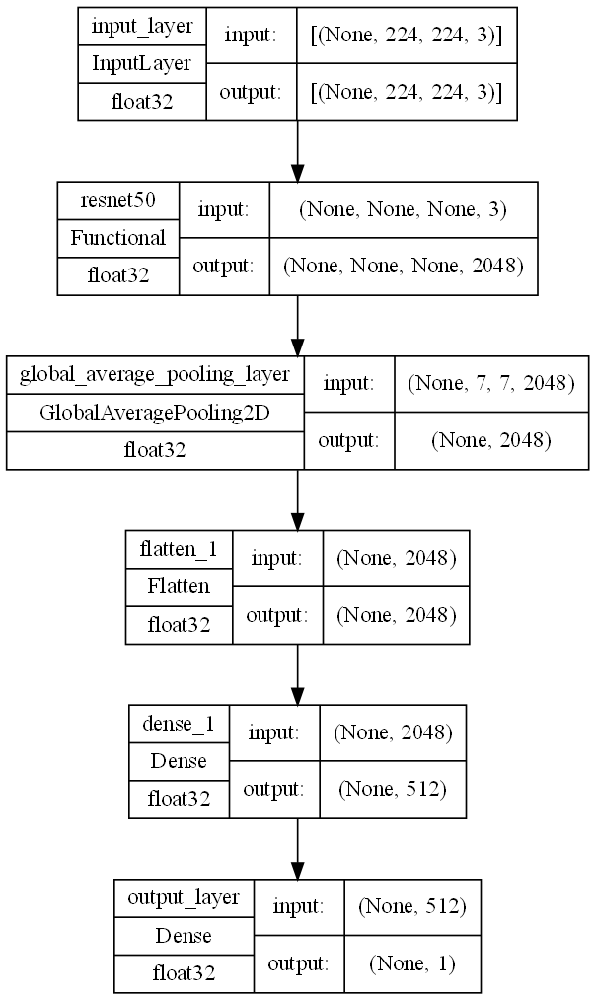

In [9]:
tf.keras.utils.plot_model(
    model,                 # 시각화할 Keras 모델
    show_shapes=True,      # 각 레이어의 출력 형태를 시각화에 포함할지 여부(True: 각 레이어별 출력 텐서 표시)
    show_layer_names=True, # 각 레이어의 이름을 시각화에 포함할지 여부
    show_dtype=True,       # 각 레이어의 데이터 타입을 시각화에 포함할지 여부
    dpi=120                # 시각화 이미지의 해상도 설정 (점 per 인치) (높은 dpi 높은 해상도)
)

In [10]:
import pandas as pd

# history.history 속성을 사용하여 DataFrame 생성
history_dict = history.history
dataframe = pd.DataFrame(history_dict)

# DataFrame 출력
print(dataframe)


       loss  accuracy  val_loss  val_accuracy       lr
0  0.312668  0.868687  0.181429      0.935310  0.00100
1  0.106712  0.960269  0.138498      0.954178  0.00100
2  0.045047  0.987879  0.128723      0.948787  0.00100
3  0.020541  0.996633  0.122814      0.959569  0.00100
4  0.010801  1.000000  0.133327      0.959569  0.00100
5  0.006554  1.000000  0.134547      0.962264  0.00100
6  0.003653  1.000000  0.133311      0.962264  0.00050
7  0.002637  1.000000  0.134751      0.962264  0.00050
8  0.002241  1.000000  0.134902      0.962264  0.00025


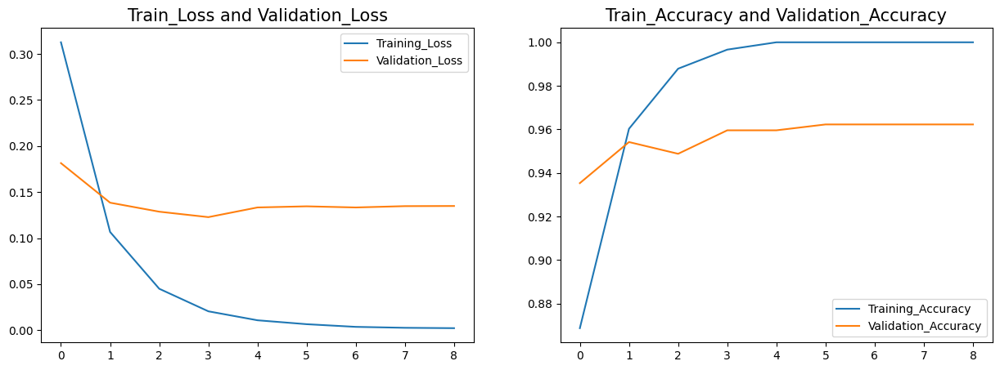

In [11]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(dataframe["loss"], label="Training_Loss")
plt.plot(dataframe["val_loss"], label="Validation_Loss")
plt.title('Train_Loss and Validation_Loss',fontsize=15)
plt.legend()

plt.subplot(1,2,2)
plt.plot(dataframe["accuracy"], label="Training_Accuracy")
plt.plot(dataframe["val_accuracy"], label="Validation_Accuracy")
plt.title('Train_Accuracy and Validation_Accuracy',fontsize=15)
plt.legend()
plt.show()

In [12]:
loss, accuracy=model.evaluate(val_data)
print(f"Accuracy:{accuracy}")
print(f"Loss:{loss}")

12/12 [==============================] - 5s 236ms/step - loss: 0.1228 - accuracy: 0.9596
Accuracy:0.9595687389373779
Loss:0.12281371653079987


In [13]:
x_val=[]
y_val=[]


for image, label in val_data:
    x_val.extend(image.numpy())
    y_val.extend(label.numpy())    

In [14]:
# Lets make the Predictions
predictions=model.predict(np.array(x_val))

y_pred=[int(np.round(prediction)) for prediction in predictions]

12/12 [==============================] - 3s 227ms/step


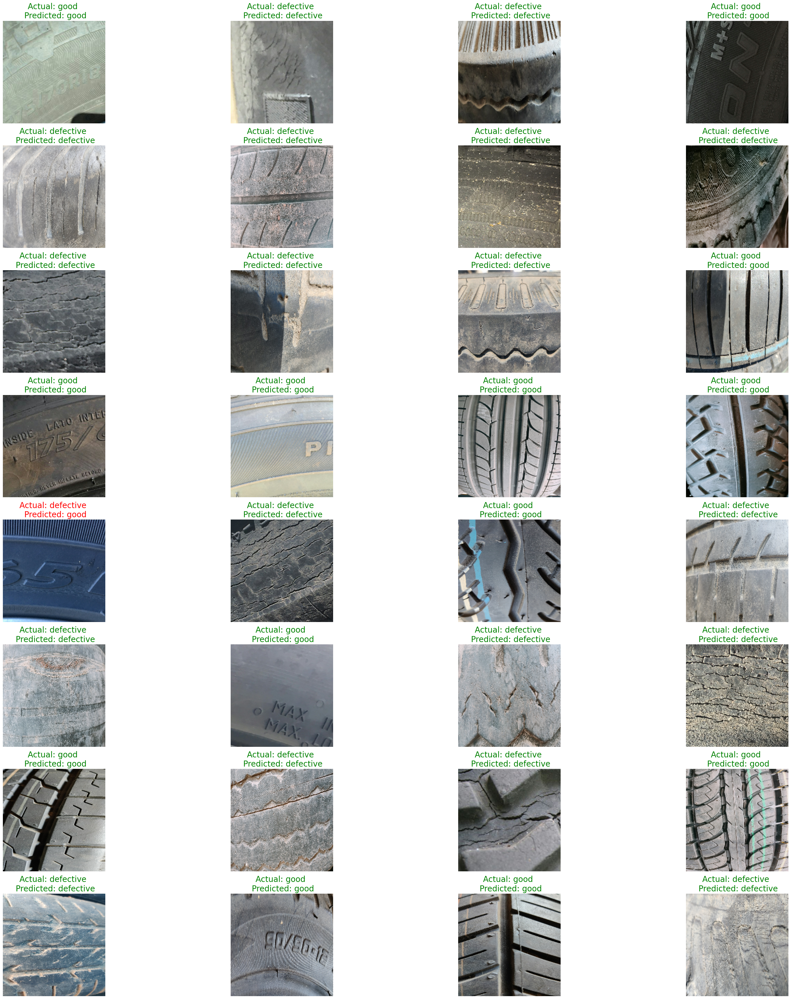

In [15]:
plt.figure(figsize=(35, 35),tight_layout=True, facecolor="white")


for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(x_val[i].astype("uint8"))
    actual_label = class_names[y_val[i]]
    predicted_label = class_names[y_pred[i]]
    
    # Check if the actual and predicted labels are the same
    if actual_label == predicted_label:
        label_color ='green'
    else:
        label_color = 'red'
    
     
    plt.title(f'Actual: {actual_label} \n Predicted: {predicted_label}', color=label_color,fontsize=20)
    plt.axis("off")

plt.show()

F1-Score:[0.9588804244219984]
Precision:[0.9592132505175983]
Recall:[0.9585622304920551]
Classification_Report
-----------------------
              precision    recall  f1-score   support

           0       0.97      0.96      0.96       210
           1       0.95      0.96      0.95       161

    accuracy                           0.96       371
   macro avg       0.96      0.96      0.96       371
weighted avg       0.96      0.96      0.96       371

Confusion_Matrix
----------------------


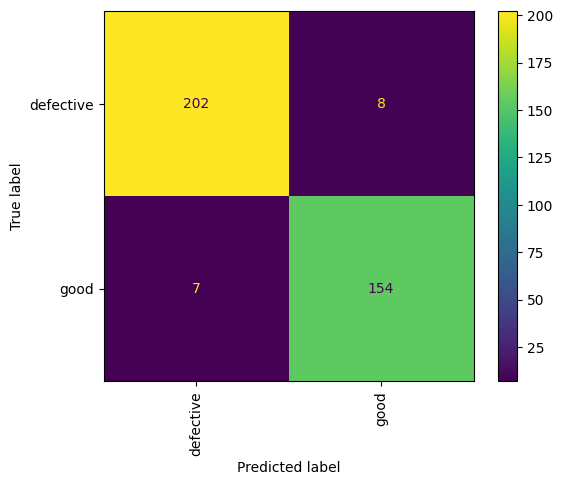

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, precision_score, recall_score, classification_report, ConfusionMatrixDisplay

f1_scores=[]
precision_scores=[]
recall_scores=[]

f1_scores.append(f1_score(y_pred, y_val, average="macro"))
precision_scores.append(precision_score(y_pred, y_val, average="macro"))
recall_scores.append(recall_score(y_pred, y_val, average="macro"))


# Print the Results
print(f"F1-Score:{f1_scores}")
print(f"Precision:{precision_scores}")
print(f"Recall:{recall_scores}")



print("Classification_Report")
print("-----------------------")
print(classification_report(y_val,y_pred))
print("Confusion_Matrix")
print("----------------------")
ConfusionMatrixDisplay.from_predictions(y_val, y_pred, display_labels=class_names, xticks_rotation="vertical")
plt.show()


In [18]:
model_name=["ResNet50_finetuning"]
result_df= pd.DataFrame({"F1_Score":f1_scores, "Precision_Score":precision_scores, "Recall_Score":recall_scores}, index=model_name)
result_df= result_df.T.sort_values(by="ResNet50_finetuning", ascending=False)
result_df

,ResNet50_finetuning
Precision_Score,0.959213
F1_Score,0.958880
Recall_Score,0.958562


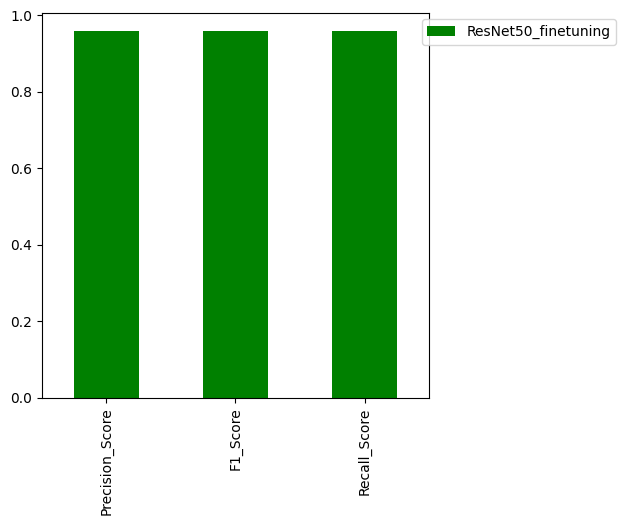

In [19]:
result_df.plot(kind="bar",figsize=(5,5), color="Green").legend(bbox_to_anchor=(1.5,1))